# [Tensorflow - Help Protect the Great Barrier Reef]

# Import Libraries

In [1]:
import numpy as np
from tqdm.notebook import tqdm
tqdm.pandas()
import pandas as pd
import os
import cv2
import matplotlib.pyplot as plt
import glob

import shutil
import sys
sys.path.append('../data')

from joblib import Parallel, delayed

from IPython.display import display

In [2]:
import wandb

try:
    from kaggle_secrets import UserSecretsClient
    user_secrets = UserSecretsClient()
    api_key = user_secrets.get_secret("WANDB")
    wandb.login(key='b4d6bb52d1e0804563e845703788199f6ed67350')
    anonymous = None
except:
    wandb.login(anonymous='must')
    print('To use your W&B account,\nGo to Add-ons -> Secrets and provide your W&B access token. Use the Label name as WANDB. \nGet your W&B access token from here: https://wandb.ai/authorize')


Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: yphy (use `wandb login --relogin` to force relogin)


To use your W&B account,
Go to Add-ons -> Secrets and provide your W&B access token. Use the Label name as WANDB. 
Get your W&B access token from here: https://wandb.ai/authorize


In [3]:
FOLD      = 1 # which fold to train
DIM       = 4500#3584#4500#3000#3000 
MODEL     = 'yolov5s6'
BATCH     = 4
EPOCHS    = 80#40#7
OPTMIZER  = 'Adam'

PROJECT   = 'great-barrier-reef-public' # w&b in yolov5
NAME      = f'{MODEL}-dim{DIM}-fold{FOLD}' # w&b for yolov5

REMOVE_NOBBOX = True # remove images with no bbox
ROOT_DIR  = '../data/'
IMAGE_DIR = '/mnt/hdd1/wearly/kaggle/greatbarrierreef/working/images' # directory to save images
LABEL_DIR = '/mnt/hdd1/wearly/kaggle/greatbarrierreef/working/labels' # directory to save labels

## Create Directories

In [4]:
!mkdir -p {IMAGE_DIR}
!mkdir -p {LABEL_DIR}

## Get Paths

In [5]:
# Train Data
df = pd.read_csv(f'{ROOT_DIR}/train.csv')
df['old_image_path'] = f'{ROOT_DIR}/train_images/video_'+df.video_id.astype(str)+'/'+df.video_frame.astype(str)+'.jpg'
df['image_path']  = f'{IMAGE_DIR}/'+df.image_id+'.jpg'
df['label_path']  = f'{LABEL_DIR}/'+df.image_id+'.txt'
df['annotations'] = df['annotations'].progress_apply(eval)
display(df.head(2))

  0%|          | 0/23501 [00:00<?, ?it/s]

,video_id,sequence,video_frame,sequence_frame,image_id,annotations,old_image_path,image_path,label_path
0,0,40258,0,0,0-0,[],../data//train_images/video_0/0.jpg,/mnt/hdd1/wearly/kaggle/greatbarrierreef/worki...,/mnt/hdd1/wearly/kaggle/greatbarrierreef/worki...
1,0,40258,1,1,0-1,[],../data//train_images/video_0/1.jpg,/mnt/hdd1/wearly/kaggle/greatbarrierreef/worki...,/mnt/hdd1/wearly/kaggle/greatbarrierreef/worki...


## Number of BBoxes
> Nearly 80% images are without any bbox.

In [6]:
df['num_bbox'] = df['annotations'].progress_apply(lambda x: len(x))
data = (df.num_bbox>0).value_counts(normalize=True)*100
print(f"No BBox: {data[0]:0.2f}% | With BBox: {data[1]:0.2f}%")

  0%|          | 0/23501 [00:00<?, ?it/s]

No BBox: 79.07% | With BBox: 20.93%


# Clean Data
좌표값이 없는 데이터는 제외

In [7]:
if REMOVE_NOBBOX:
    df = df.query("num_bbox>0")

# Write Images
* We need to copy the Images to Current Directory(`/kaggle/working`) as `/kaggle/input` doesn't have **write access** which is needed for **YOLOv5**.
* We can make this process faster using **Joblib** which uses **Parallel** computing.

In [8]:
def make_copy(row):
    shutil.copyfile(row.old_image_path, row.image_path)
    return

In [9]:
image_paths = df.old_image_path.tolist()
_ = Parallel(n_jobs=-1, backend='threading')(delayed(make_copy)(row) for _, row in tqdm(df.iterrows(), total=len(df)))

  0%|          | 0/4919 [00:00<?, ?it/s]

# Helper

In [10]:
# check https://github.com/awsaf49/bbox for source code of following utility functions
from bbox.utils import coco2yolo, coco2voc, voc2yolo
from bbox.utils import draw_bboxes, load_image
from bbox.utils import clip_bbox, str2annot, annot2str

def get_bbox(annots):
    bboxes = [list(annot.values()) for annot in annots]
    return bboxes

def get_imgsize(row):
    row['width'], row['height'] = imagesize.get(row['image_path'])
    return row

np.random.seed(32)
colors = [(np.random.randint(255), np.random.randint(255), np.random.randint(255))\
          for idx in range(1)]

## Create BBox

In [11]:
df['bboxes'] = df.annotations.progress_apply(get_bbox)
df.head(2)

  0%|          | 0/4919 [00:00<?, ?it/s]

,video_id,sequence,video_frame,sequence_frame,image_id,annotations,old_image_path,image_path,label_path,num_bbox,bboxes
16,0,40258,16,16,0-16,"[{'x': 559, 'y': 213, 'width': 50, 'height': 32}]",../data//train_images/video_0/16.jpg,/mnt/hdd1/wearly/kaggle/greatbarrierreef/worki...,/mnt/hdd1/wearly/kaggle/greatbarrierreef/worki...,1,"[[559, 213, 50, 32]]"
17,0,40258,17,17,0-17,"[{'x': 558, 'y': 213, 'width': 50, 'height': 32}]",../data//train_images/video_0/17.jpg,/mnt/hdd1/wearly/kaggle/greatbarrierreef/worki...,/mnt/hdd1/wearly/kaggle/greatbarrierreef/worki...,1,"[[558, 213, 50, 32]]"


## Get Image-Size
> All Images have same dimension, [Width, Height] =  `[1280, 720]`

In [12]:
df['width']  = 1280
df['height'] = 720
display(df.head(2))

,video_id,sequence,video_frame,sequence_frame,image_id,annotations,old_image_path,image_path,label_path,num_bbox,bboxes,width,height
16,0,40258,16,16,0-16,"[{'x': 559, 'y': 213, 'width': 50, 'height': 32}]",../data//train_images/video_0/16.jpg,/mnt/hdd1/wearly/kaggle/greatbarrierreef/worki...,/mnt/hdd1/wearly/kaggle/greatbarrierreef/worki...,1,"[[559, 213, 50, 32]]",1280,720
17,0,40258,17,17,0-17,"[{'x': 558, 'y': 213, 'width': 50, 'height': 32}]",../data//train_images/video_0/17.jpg,/mnt/hdd1/wearly/kaggle/greatbarrierreef/worki...,/mnt/hdd1/wearly/kaggle/greatbarrierreef/worki...,1,"[[558, 213, 50, 32]]",1280,720


# Create Labels
We need to export our labels to **YOLO** format, with one `*.txt` file per image (if no objects in image, no `*.txt` file is required). The *.txt file specifications are:

* One row per object
* Each row is class `[x_center, y_center, width, height]` format.
* Box coordinates must be in **normalized** `xywh` format (from `0 - 1`). If your boxes are in pixels, divide `x_center` and `width` by `image width`, and `y_center` and `height` by `image height`.
* Class numbers are **zero-indexed** (start from `0`).

> Competition bbox format is **COCO** hence `[x_min, y_min, width, height]`. So, we need to convert form **COCO** to **YOLO** format.


In [13]:
cnt = 0
all_bboxes = []
bboxes_info = []
for row_idx in tqdm(range(df.shape[0])):
    row = df.iloc[row_idx]
    image_height = row.height
    image_width  = row.width
    bboxes_coco  = np.array(row.bboxes).astype(np.float32).copy()
    num_bbox     = len(bboxes_coco)
    names        = ['cots']*num_bbox
    labels       = np.array([0]*num_bbox)[..., None].astype(str)
    ## Create Annotation(YOLO)
    with open(row.label_path, 'w') as f:
        if num_bbox<1:
            annot = ''
            f.write(annot)
            cnt+=1
            continue
        bboxes_voc  = coco2voc(bboxes_coco, image_height, image_width)
        #print(bboxes_voc)
        bboxes_voc  = clip_bbox(bboxes_voc, image_height, image_width)
        bboxes_yolo = voc2yolo(bboxes_voc, image_height, image_width).astype(str)
        all_bboxes.extend(bboxes_yolo.astype(float))
        bboxes_info.extend([[row.image_id, row.video_id, row.sequence]]*len(bboxes_yolo))
        annots = np.concatenate([labels, bboxes_yolo], axis=1)
        string = annot2str(annots)
        f.write(string)
print('Missing:',cnt)

  0%|          | 0/4919 [00:00<?, ?it/s]

Missing: 0


# Create Folds
> Number of samples aren't same in each fold which can create large variance in **Cross-Validation**.

In [14]:
df = df.reset_index(drop=True)
df['fold'] = -1

In [15]:
# df = df.sample(frac=1).reset_index(drop=True)

In [16]:
df.iloc[df.head(int(int(len(df))*0.95)).index.tolist(),-1] = 0

In [17]:
df.iloc[df.tail(int(len(df))-int(int(len(df))*0.95)).index.tolist(),-1] = 1

In [18]:
# from sklearn.model_selection import GroupKFold
# kf = GroupKFold(n_splits = 2)
# df = df.reset_index(drop=True)
# df['fold'] = -1
# for fold, (train_idx, val_idx) in enumerate(kf.split(df, groups=df.video_id.tolist())):
#     df.loc[val_idx, 'fold'] = fold
# display(df.fold.value_counts())

In [19]:
display(df.fold.value_counts())

0    4673
1     246
Name: fold, dtype: int64

# ⭕ BBox Distribution

In [20]:
bbox_df = pd.DataFrame(np.concatenate([bboxes_info, all_bboxes], axis=1),
             columns=['image_id','video_id','sequence',
                     'xmid','ymid','w','h'])
bbox_df[['xmid','ymid','w','h']] = bbox_df[['xmid','ymid','w','h']].astype(float)
bbox_df['area'] = bbox_df.w * bbox_df.h * 1280 * 720
bbox_df = bbox_df.merge(df[['image_id','fold']], on='image_id', how='left')
bbox_df.head(2)

,image_id,video_id,sequence,xmid,ymid,w,h,area,fold
0,0-16,0,40258,0.456250,0.318056,0.039062,0.044444,1600.00092,0
1,0-17,0,40258,0.455469,0.318056,0.039062,0.044444,1600.00092,0


## `x_center` Vs `y_center`

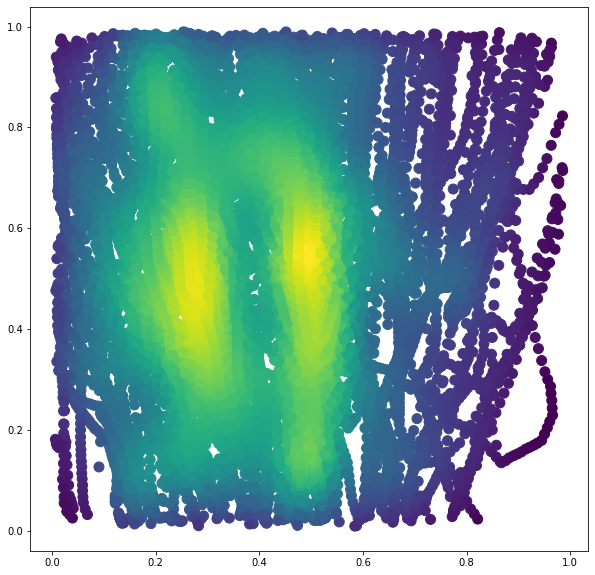

In [21]:
from scipy.stats import gaussian_kde

all_bboxes = np.array(all_bboxes)

x_val = all_bboxes[...,0]
y_val = all_bboxes[...,1]

# Calculate the point density
xy = np.vstack([x_val,y_val])
z = gaussian_kde(xy)(xy)

fig, ax = plt.subplots(figsize = (10, 10))
# ax.axis('off')
ax.scatter(x_val, y_val, c=z, s=100, cmap='viridis')
# ax.set_xlabel('x_mid')
# ax.set_ylabel('y_mid')
plt.show()

## `width` Vs `height`

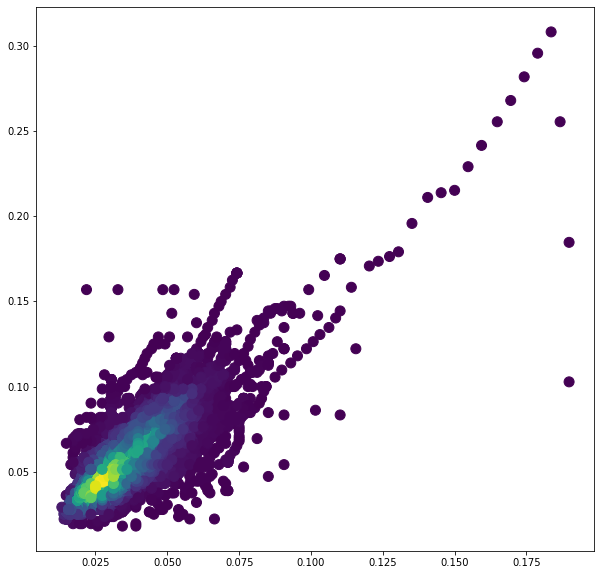

In [22]:
x_val = all_bboxes[...,2]
y_val = all_bboxes[...,3]

# Calculate the point density
xy = np.vstack([x_val,y_val])
z = gaussian_kde(xy)(xy)

fig, ax = plt.subplots(figsize = (10, 10))
# ax.axis('off')
ax.scatter(x_val, y_val, c=z, s=100, cmap='viridis')
# ax.set_xlabel('bbox_width')
# ax.set_ylabel('bbox_height')
plt.show()

## Area

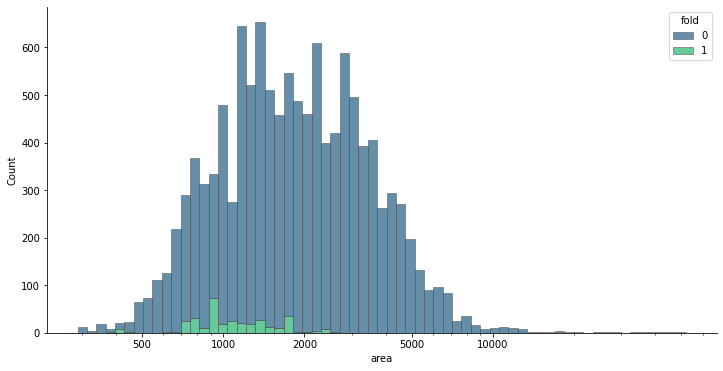

In [23]:
import matplotlib as mpl
import seaborn as sns

f, ax = plt.subplots(figsize=(12, 6))
sns.despine(f)

sns.histplot(
    bbox_df,
    x="area", hue="fold",
    multiple="stack",
    palette="viridis",
    edgecolor=".3",
    linewidth=.5,
    log_scale=True,
)
ax.xaxis.set_major_formatter(mpl.ticker.ScalarFormatter())
ax.set_xticks([500, 1000, 2000, 5000, 10000]);

# 🌈 Visualization

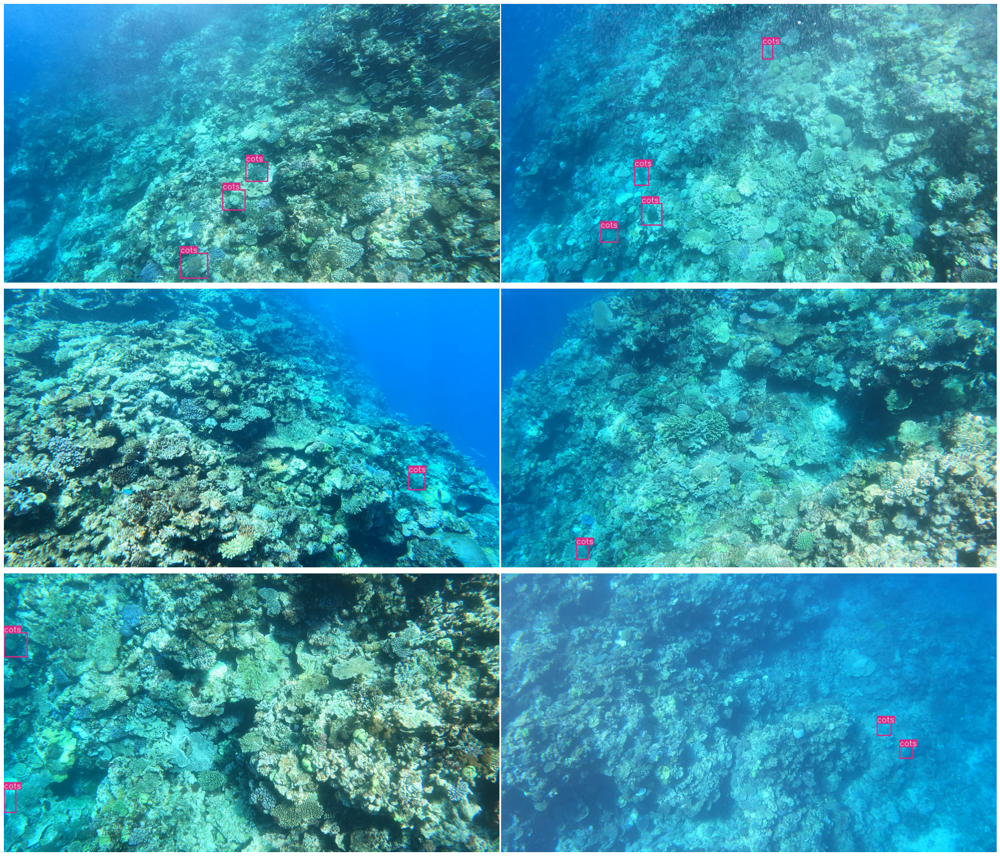

In [24]:
df2 = df[(df.num_bbox>0)].sample(100) # takes samples with bbox
y = 3; x = 2
plt.figure(figsize=(12.8*x, 7.2*y))
for idx in range(x*y):
    row = df2.iloc[idx]
    img           = load_image(row.image_path)
    image_height  = row.height
    image_width   = row.width
    with open(row.label_path) as f:
        annot = str2annot(f.read())
    bboxes_yolo = annot[...,1:]
    labels      = annot[..., 0].astype(int).tolist()
    names         = ['cots']*len(bboxes_yolo)
    plt.subplot(y, x, idx+1)
    plt.imshow(draw_bboxes(img = img,
                           bboxes = bboxes_yolo, 
                           classes = names,
                           class_ids = labels,
                           class_name = True, 
                           colors = colors, 
                           bbox_format = 'yolo',
                           line_thickness = 2))
    plt.axis('OFF')
plt.tight_layout()
plt.show()

# 🍚 Dataset

In [25]:
train_files = []
val_files   = []
train_df = df.query("fold!=@FOLD")
valid_df = df.query("fold==@FOLD")
train_files += list(train_df.image_path.unique())
val_files += list(valid_df.image_path.unique())
len(train_files), len(val_files)

(4673, 246)

# ⚙️ Configuration
The dataset config file requires
1. The dataset root directory path and relative paths to `train / val / test` image directories (or *.txt files with image paths)
2. The number of classes `nc` and 
3. A list of class `names`:`['cots']`

In [26]:
import yaml

cwd = '/mnt/hdd1/wearly/kaggle/greatbarrierreef/working/'

with open(os.path.join( cwd , 'train.txt'), 'w') as f:
    for path in train_df.image_path.tolist():
        f.write(path+'\n')
            
with open(os.path.join(cwd , 'val.txt'), 'w') as f:
    for path in valid_df.image_path.tolist():
        f.write(path+'\n')

data = dict(
    path  = '/mnt/hdd1/wearly/kaggle/greatbarrierreef/working/',
    train =  os.path.join( cwd , 'train.txt') ,
    val   =  os.path.join( cwd , 'val.txt' ),
    nc    = 1,
    names = ['cots'],
    )

with open(os.path.join( cwd , 'gbr.yaml'), 'w') as outfile:
    yaml.dump(data, outfile, default_flow_style=False)

f = open(os.path.join( cwd , 'gbr.yaml'), 'r')
print('\nyaml:')
print(f.read())


yaml:
names:
- cots
nc: 1
path: /mnt/hdd1/wearly/kaggle/greatbarrierreef/working/
train: /mnt/hdd1/wearly/kaggle/greatbarrierreef/working/train.txt
val: /mnt/hdd1/wearly/kaggle/greatbarrierreef/working/val.txt



In [27]:
%%writefile /mnt/hdd1/wearly/kaggle/greatbarrierreef/working/hyp.yaml
lr0: 0.001  # initial learning rate (SGD=1E-2, Adam=1E-3)
lrf: 0.1  # final OneCycleLR learning rate (lr0 * lrf)
momentum: 0.937  # SGD momentum/Adam beta1
weight_decay: 0.0005  # optimizer weight decay 5e-4
warmup_epochs: 3.0  # warmup epochs (fractions ok)
warmup_momentum: 0.8  # warmup initial momentum
warmup_bias_lr: 0.1  # warmup initial bias lr
box: 0.05  # box loss gain
cls: 0.5  # cls loss gain
cls_pw: 1.0  # cls BCELoss positive_weight
obj: 1.0  # obj loss gain (scale with pixels)
obj_pw: 1.0  # obj BCELoss positive_weight
iou_t: 0.20  # IoU training threshold
anchor_t: 4.0  # anchor-multiple threshold
# anchors: 3  # anchors per output layer (0 to ignore)
fl_gamma: 0.0  # focal loss gamma (efficientDet default gamma=1.5)
hsv_h: 0.015  # image HSV-Hue augmentation (fraction)
hsv_s: 0.7  # image HSV-Saturation augmentation (fraction)
hsv_v: 0.4  # image HSV-Value augmentation (fraction)
degrees: 0.0  # image rotation (+/- deg)
translate: 0.10  # image translation (+/- fraction)
scale: 0.5  # image scale (+/- gain)
shear: 0.0  # image shear (+/- deg)
perspective: 0.0  # image perspective (+/- fraction), range 0-0.001
flipud: 0.5  # image flip up-down (probability)
fliplr: 0.5  # image flip left-right (probability)
mosaic: 0.5  # image mosaic (probability)
mixup: 0.5 # image mixup (probability)
copy_paste: 0.0  # segment copy-paste (probability)


Overwriting /mnt/hdd1/wearly/kaggle/greatbarrierreef/working/hyp.yaml


In [28]:
%cd /mnt/hdd1/wearly/kaggle/greatbarrierreef/working
#!rm -r /kaggle/working/yolov5
!git clone https://github.com/ultralytics/yolov5 # clone
#!cp -r /kaggle/input/yolov5-lib-ds /kaggle/working/yolov5
%cd yolov5
%pip install -qr requirements.txt  # install

/mnt/hdd1/wearly/kaggle/greatbarrierreef/working
fatal: destination path 'yolov5' already exists and is not an empty directory.
/mnt/hdd1/wearly/kaggle/greatbarrierreef/working/yolov5
Note: you may need to restart the kernel to use updated packages.


In [29]:
%cd ..
from yolov5 import utils
%cd yolov5
display = utils.notebook_init()  # check

YOLOv5 🚀 v6.0-217-gd8b5beb torch 1.10.0 CUDA:0 (NVIDIA GeForce RTX 3090, 24265MiB)


Setup complete ✅ (64 CPUs, 251.6 GB RAM, 264.2/1832.3 GB disk)


# 🚅 Training

In [30]:
!python train.py --img {DIM}\
--batch {BATCH}\
--epochs {EPOCHS}\
--optimizer {OPTMIZER}\
--data /mnt/hdd1/wearly/kaggle/greatbarrierreef/working/gbr.yaml\
--hyp /mnt/hdd1/wearly/kaggle/greatbarrierreef/working/hyp.yaml\
--weights {MODEL}.pt\
--project {PROJECT} --name {NAME}\
--exist-ok

wandb: Currently logged in as: yphy (use `wandb login --relogin` to force relogin)
train: weights=yolov5s6.pt, cfg=, data=/mnt/hdd1/wearly/kaggle/greatbarrierreef/working/gbr.yaml, hyp=/mnt/hdd1/wearly/kaggle/greatbarrierreef/working/hyp.yaml, epochs=80, batch_size=4, imgsz=4500, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=Adam, sync_bn=False, workers=8, project=great-barrier-reef-public, name=yolov5s6-dim4500-fold1, exist_ok=True, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
remote: Enumerating objects: 9, done.
remote: Counting objects: 100% (5/5), done.
remote: Total 9 (delta 5), reused 5 (delta 5), pack-reused 4
Unpacking objects: 100% (9/9), 9.84 KiB | 59.00 KiB/s, done.
Command 'git fetch && git config --get


     Epoch   gpu_mem       box       obj       cls    labels  img_size
      1/79     19.4G   0.04813   0.05223         0         1      4544: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all        246        334      0.803      0.608      0.676      0.287

     Epoch   gpu_mem       box       obj       cls    labels  img_size
      2/79     19.4G   0.04404   0.05089         0         2      4544: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all        246        334      0.842      0.695      0.704      0.242

     Epoch   gpu_mem       box       obj       cls    labels  img_size
      3/79     19.4G   0.04229   0.04765         0         1      4544: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all        246        334      0.962      0.686      0.771      0.365

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all        246        334      0.958      0.745      0.854       0.35

     Epoch   gpu_mem       box       obj       cls    labels  img_size
     27/79     19.4G   0.03243    0.0382         0         2      4544: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all        246        334      0.912       0.76      0.832      0.361

     Epoch   gpu_mem       box       obj       cls    labels  img_size
     28/79     19.4G   0.03241   0.03904         0         1      4544: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all        246        334      0.897      0.805      0.853       0.38

     Epoch   gpu_mem       box       obj       cls    labels  img_size
     29/79     19.4G     0.032   0.03739         0         2      4544: 100%|███
               Class     Images     L


     Epoch   gpu_mem       box       obj       cls    labels  img_size
     52/79     19.4G   0.02872   0.03457         0         2      4544: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all        246        334      0.958      0.698       0.79      0.368

     Epoch   gpu_mem       box       obj       cls    labels  img_size
     53/79     19.4G   0.02871   0.03574         0         0      4544: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all        246        334      0.945      0.718      0.799       0.35

     Epoch   gpu_mem       box       obj       cls    labels  img_size
     54/79     19.4G   0.02832   0.03457         0         1      4544: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all        246        334      0.952      0.718       0.79      0.355

     Epoch   gpu_mem       box      

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all        246        334      0.968      0.671      0.769      0.355

     Epoch   gpu_mem       box       obj       cls    labels  img_size
     78/79     19.4G   0.02575   0.03229         0         3      4544: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all        246        334      0.963        0.7      0.794      0.369

     Epoch   gpu_mem       box       obj       cls    labels  img_size
     79/79     19.4G   0.02559   0.03128         0         1      4544: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all        246        334      0.923      0.686      0.773      0.362

80 epochs completed in 15.268 hours.
Optimizer stripped from great-barrier-reef-public/yolov5s6-dim4500-fold1/weights/last.pt, 30.9MB
Optimizer stripped from great-barrier-reef-public/yolov

## Output Files

In [31]:
OUTPUT_DIR = '{}/{}'.format(PROJECT, NAME)
!ls {OUTPUT_DIR}

confusion_matrix.png
events.out.tfevents.1644488925.user-TRX40-AORUS-MASTER.2917710.0
F1_curve.png
hyp.yaml
labels_correlogram.jpg
labels.jpg
opt.yaml
P_curve.png
PR_curve.png
R_curve.png
results.csv
results.png
train_batch0.jpg
train_batch1.jpg
train_batch2.jpg
val_batch0_labels.jpg
val_batch0_pred.jpg
val_batch1_labels.jpg
val_batch1_pred.jpg
val_batch2_labels.jpg
val_batch2_pred.jpg
weights


# 📈 Class Distribution

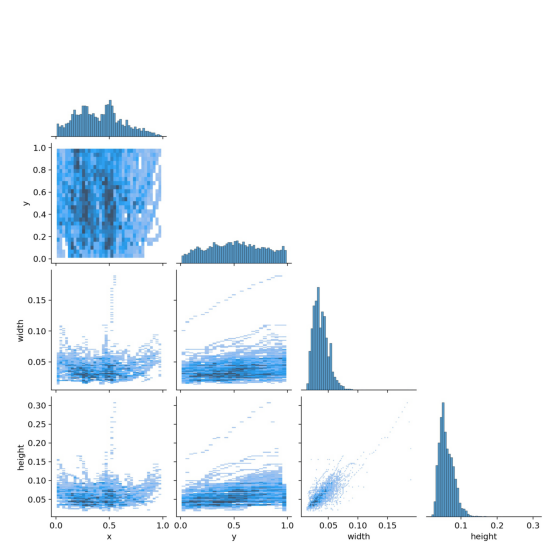

In [32]:
plt.figure(figsize = (10,10))
plt.axis('off')
plt.imshow(plt.imread(f'{OUTPUT_DIR}/labels_correlogram.jpg'));

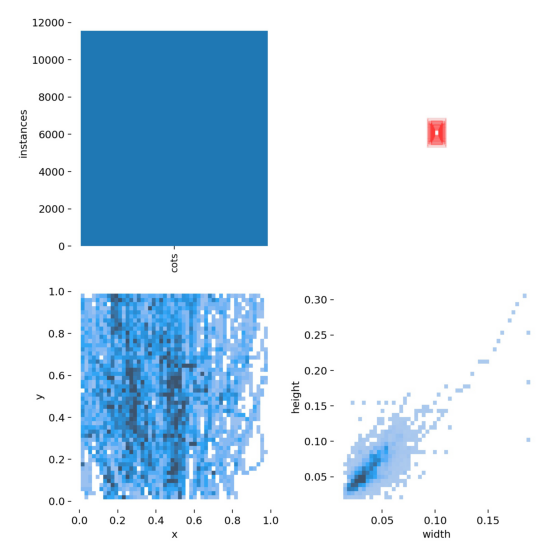

In [33]:
plt.figure(figsize = (10,10))
plt.axis('off')
plt.imshow(plt.imread(f'{OUTPUT_DIR}/labels.jpg'));

# 🔭 Batch Image

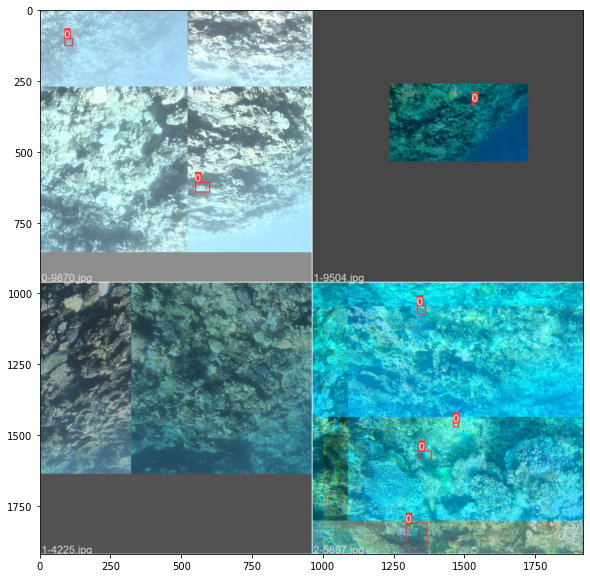

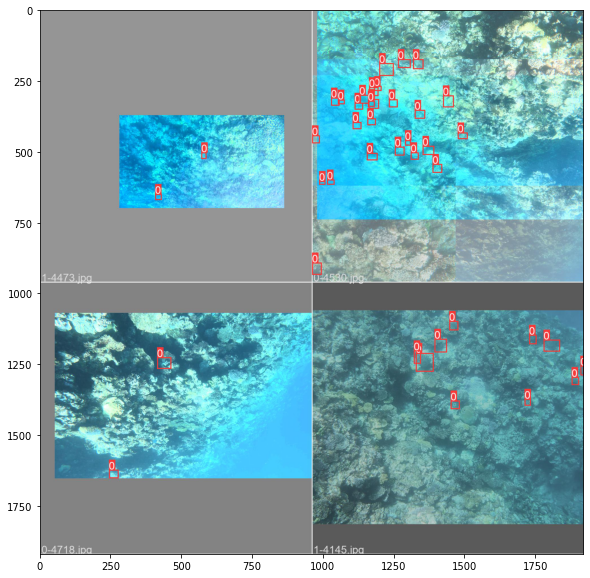

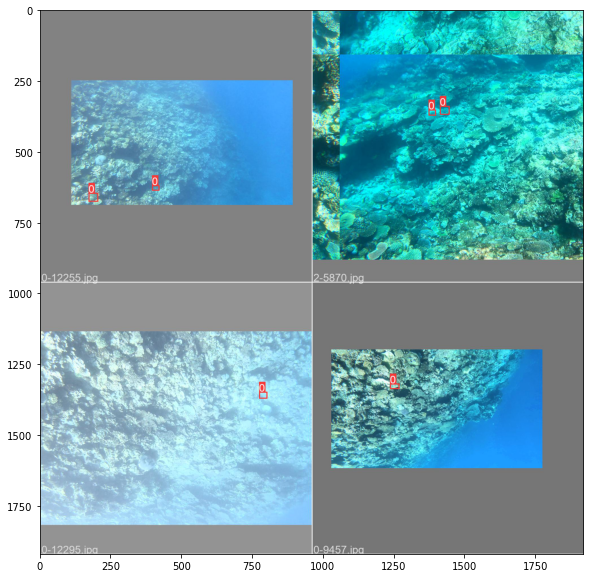

In [34]:
import matplotlib.pyplot as plt
plt.figure(figsize = (10, 10))
plt.imshow(plt.imread(f'{OUTPUT_DIR}/train_batch0.jpg'))

plt.figure(figsize = (10, 10))
plt.imshow(plt.imread(f'{OUTPUT_DIR}/train_batch1.jpg'))

plt.figure(figsize = (10, 10))
plt.imshow(plt.imread(f'{OUTPUT_DIR}/train_batch2.jpg'))

## GT Vs Pred

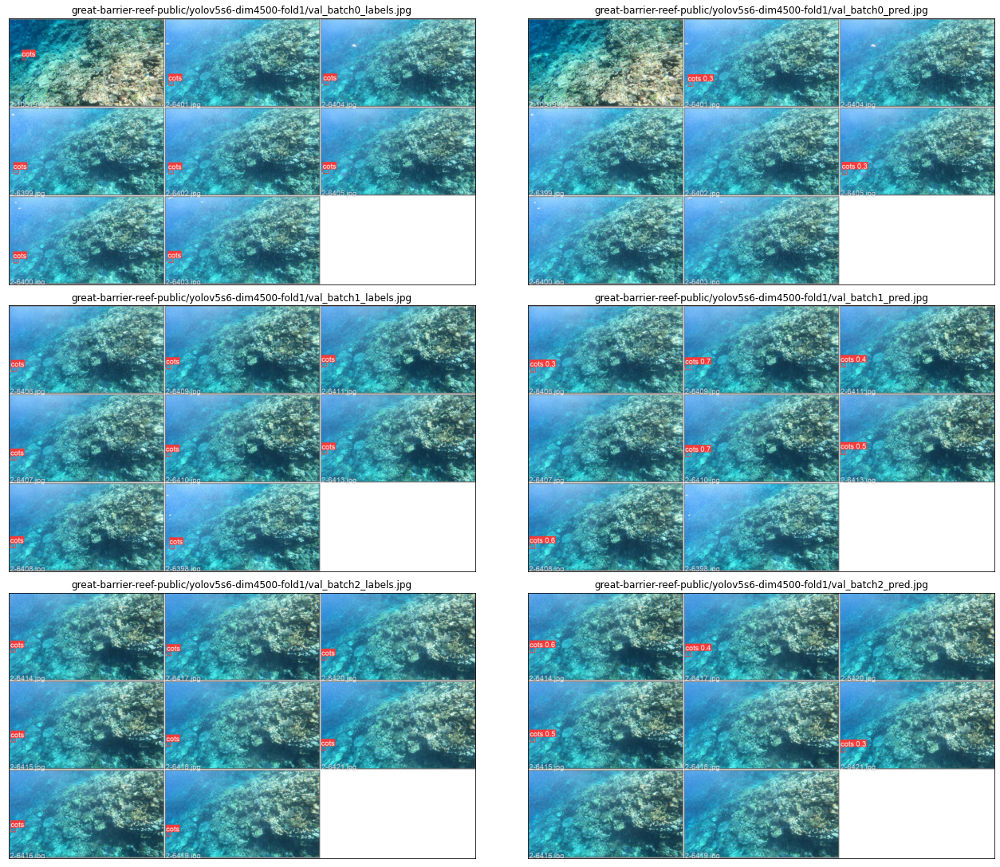

In [35]:
fig, ax = plt.subplots(3, 2, figsize = (2*9,3*5), constrained_layout = True)
for row in range(3):
    ax[row][0].imshow(plt.imread(f'{OUTPUT_DIR}/val_batch{row}_labels.jpg'))
    ax[row][0].set_xticks([])
    ax[row][0].set_yticks([])
    ax[row][0].set_title(f'{OUTPUT_DIR}/val_batch{row}_labels.jpg', fontsize = 12)
    
    ax[row][1].imshow(plt.imread(f'{OUTPUT_DIR}/val_batch{row}_pred.jpg'))
    ax[row][1].set_xticks([])
    ax[row][1].set_yticks([])
    ax[row][1].set_title(f'{OUTPUT_DIR}/val_batch{row}_pred.jpg', fontsize = 12)
plt.show()

# 🔍 Result

## Score Vs Epoch

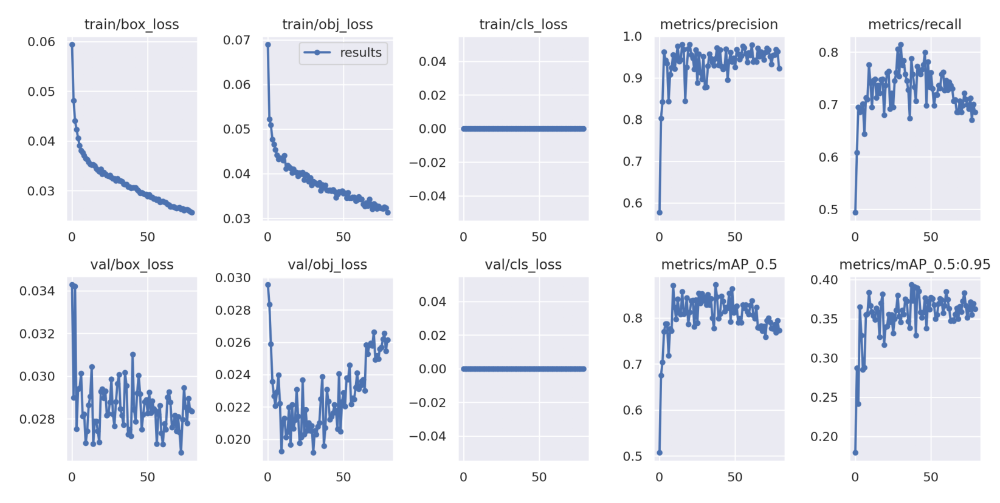

In [36]:
plt.figure(figsize=(30,15))
plt.axis('off')
plt.imshow(plt.imread(f'{OUTPUT_DIR}/results.png'));

## Confusion Matrix

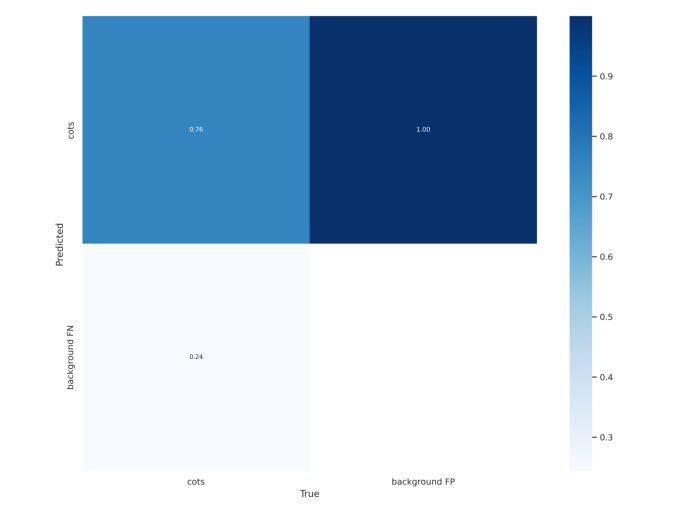

In [37]:
plt.figure(figsize=(12,10))
plt.axis('off')
plt.imshow(plt.imread(f'{OUTPUT_DIR}/confusion_matrix.png'));

## Metrics

Metric: F1


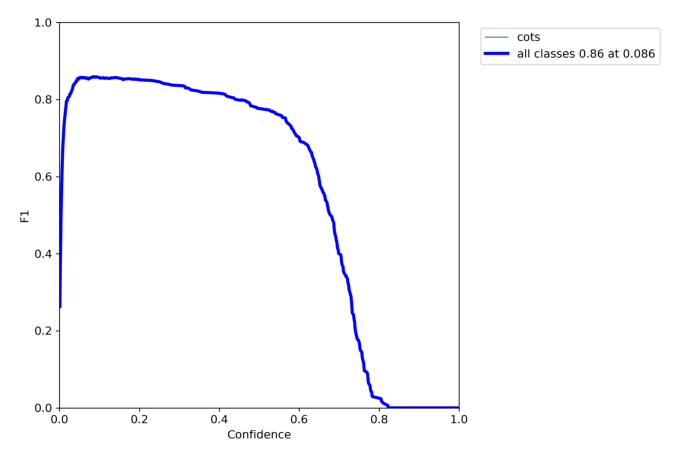

Metric: PR


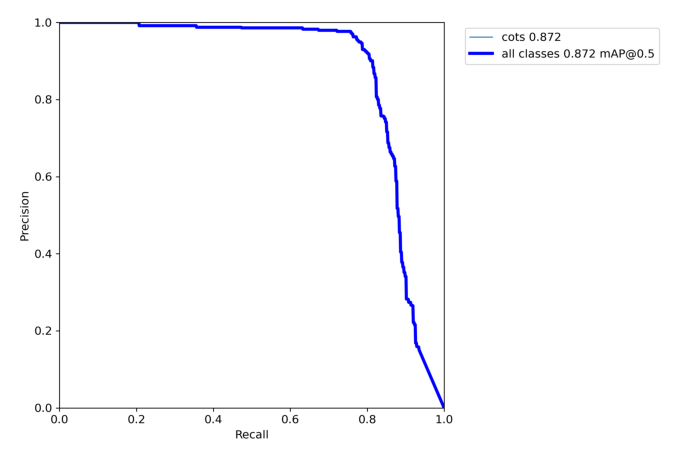

Metric: P


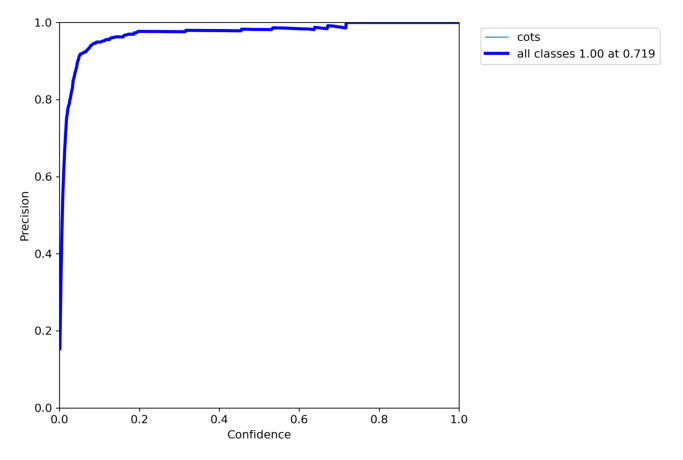

Metric: R


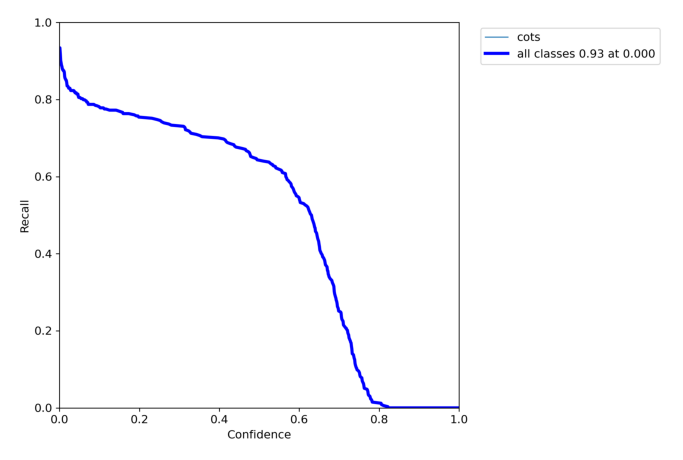

In [38]:
for metric in ['F1', 'PR', 'P', 'R']:
    print(f'Metric: {metric}')
    plt.figure(figsize=(12,10))
    plt.axis('off')
    plt.imshow(plt.imread(f'{OUTPUT_DIR}/{metric}_curve.png'));
    plt.show()

## Please Upvote if you find this Helpful

# ✂️ Remove Files

In [39]:
!rm -r {IMAGE_DIR}
!rm -r {LABEL_DIR}